In [1]:
!rm -rf thesis
!git clone -b on_exp https://github.com/yosefnuragaw/thesis
%cd thesis
# !pip install --upgrade accelerate transformers
# !pip install flash-attn --no-build-isolation

Cloning into 'thesis'...
remote: Enumerating objects: 14594, done.
remote: Counting objects: 100% (1/1), done.
remote: Total 14594 (delta 0), reused 0 (delta 0), pack-reused 14593 (from 3)
Receiving objects: 100% (14594/14594), 277.34 MiB | 28.52 MiB/s, done.
Resolving deltas: 100% (5155/5155), done.
Updating files: 100% (5038/5038), done.
/kaggle/working/thesis


In [2]:
import matplotlib.pyplot as plt
from typing import Dict
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import make_interp_spline # Import fungsi untuk menghaluskan garis
from typing import Dict

def plot_bipo_data(data_bipo: Dict[str, Dict[str, Dict[float, float]]]):
    """
    Fungsi untuk membuat line plot yang SMOOTH dari nested dictionary.
    Membuat 2 plot berdasarkan kategori (Coherence dan Behavioral).
    """
    first_key = list(data_bipo.keys())[0]
    metrics = list(data_bipo[first_key].keys())
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    for i, metric in enumerate(metrics):
        ax = axes[i] 
        
        for layer_name, layer_data in data_bipo.items():
            if metric in layer_data:
                # 1. Ambil data asli (pastikan berurutan)
                # Diurutkan berdasarkan sumbu X (multiplier) agar interpolasi tidak error
                sorted_items = sorted(layer_data[metric].items())
                x_values = np.array([item[0] for item in sorted_items])
                y_values = np.array([item[1] for item in sorted_items])
                
                # --- PROSES SMOOTHING (INTERPOLASI) ---
                # 2. Buat sumbu X baru yang jauh lebih padat (misal 300 titik)
                x_smooth = np.linspace(x_values.min(), x_values.max(), 300)
                
                # 3. Hitung nilai Y baru berdasarkan titik X yang padat menggunakan B-Spline
                # k=3 artinya interpolasi kubik (standar untuk kurva yang mulus)
                spline = make_interp_spline(x_values, y_values, k=3) 
                y_smooth = spline(x_smooth)
                # -------------------------------------

                # 4. Plot garis yang sudah dihaluskan
                ax.plot(x_smooth, y_smooth, label=f'{layer_name}', linewidth=2.0)
                
                # 5. (Opsional) Tetap tampilkan titik (marker) aslinya agar jelas data aslinya di mana
                ax.scatter(x_values, y_values, marker='o', s=30, zorder=5)
        
        # Styling grafik
        ax.set_title(f'{metric} Evaluation')
        ax.set_xlabel('Multiplier')
        ax.set_ylabel(f'Average {metric} Score')
        ax.grid(True, linestyle='-', linewidth=1.5, alpha=0.5)
        ax.legend(loc='lower right')
    
    plt.tight_layout()
    plt.show()

# --- Contoh Cara Memanggilnya Tetap Sama ---
# plot_bipo_data(data)
# --- Contoh Penggunaan Fungsi ---


In [39]:
import torch
import matplotlib.pyplot as plt
import os
import math

def plot_layer_comparison_grid(vec_dir, act_dir, epoch, target_layers, model_id=None, mul=1.0, cols=5):
    num_plots = len(target_layers)
    rows = math.ceil(num_plots / cols)
    
    fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 6 * rows), squeeze=False)
    axes_flat = axes.flatten()
    
    fig.suptitle(f"Steering Projection: {model_id} (Epoch {epoch}, Mul {mul})", fontsize=18, y=1.02)

    for i, layer in enumerate(target_layers):
        ax = axes_flat[i]
        try:
            # 1. Setup Paths
            v_path = os.path.join(vec_dir, f"vec_ep{epoch}_layer{layer}.pt")
            pos_path = os.path.join(act_dir, f"{model_id}_buffer_{layer}_{mul}.pt")
            neg_path = os.path.join(act_dir, f"{model_id}_buffer_{layer}_{-mul}.pt")

            steering_vec = torch.load(v_path, map_location='cpu').to(torch.float32)
            
            def load_and_stack(path):
                data = torch.load(path, map_location='cpu')
                if isinstance(data, list):
                    return torch.stack([t.detach().cpu().to(torch.float32).reshape(-1) for t in data])
                return data.to(torch.float32)

            pos_activations = load_and_stack(pos_path)
            neg_activations = load_and_stack(neg_path)

            # 2. Apply Steering
            # Note: pos gets +steering, neg gets -steering
            pos_activations_new = pos_activations + (mul * steering_vec)
            neg_activations_new = neg_activations - (mul * steering_vec)

            # 3. Basis Construction
            r_prime = steering_vec / torch.norm(steering_vec)
            gen = torch.Generator().manual_seed(42)
            k = torch.randn(steering_vec.shape[-1], generator=gen)
            k = (k - torch.dot(k, r_prime) * r_prime)
            k = k / torch.norm(k)

            # 4. Projection Logic
            # Original Points
            x_pos, y_pos = (pos_activations @ r_prime).numpy(), (pos_activations @ k).numpy()
            x_neg, y_neg = (neg_activations @ r_prime).numpy(), (neg_activations @ k).numpy()
            
            # Steered Points
            x_pos_new, y_pos_new = (pos_activations_new @ r_prime).numpy(), (pos_activations_new @ k).numpy()
            x_neg_new, y_neg_new = (neg_activations_new @ r_prime).numpy(), (neg_activations_new @ k).numpy()

            # 5. Plotting
            # Plot Original (Dimmed)
            ax.scatter(x_pos, y_pos, color='#1f90ce', alpha=0.15, s=15, label='Original (+)')
            ax.scatter(x_neg, y_neg, color='#ffab23', alpha=0.15, s=15, label='Original (-)')
            
            # Plot Steered (Bright)
            ax.scatter(x_pos_new, y_pos_new, color='#003f5c', alpha=0.9, s=25, label='Steered (+)')
            ax.scatter(x_neg_new, y_neg_new, color='#d45087', alpha=0.9, s=25, label='Steered (-)')
            
            ax.axhline(0, color='black', lw=0.5, ls='--')
            ax.axvline(0, color='black', lw=0.5, ls='--')
            ax.set_title(f"Layer {layer}")
            ax.set_xlabel("Concept Axis (r')")
            if i % cols == 0:
                ax.set_ylabel("Orthogonal Axis (k)")
            
        except Exception as e:
            ax.text(0.5, 0.5, f"Error: {e}", ha='center', va='center')

    # Global Legend
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.95, 0.95), ncol=2)

    for j in range(i + 1, len(axes_flat)):
        axes_flat[j].axis('off')

    plt.tight_layout()
    plt.show()

In [4]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import make_interp_spline

def plot_accuracy_instances(instances):
    """
    Receives a list of dicts and plots Positive vs Negative accuracy 
    side-by-side with smoothed curves.
    """
    # Create a figure with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    
    for inst in instances:
        label = inst.get("instance_id", "Unknown Instance")
        
        # Convert lists to numpy arrays for interpolation
        x = np.array(inst["multiplier"])
        y_pos = np.array(inst["positive_accuracy"])
        y_neg = np.array(inst["negative_accuracy"])
        
        # Generate 300 evenly spaced points between the min and max of x
        x_smooth = np.linspace(x.min(), x.max(), 300)
        
        # Determine spline degree (k=3 is cubic, but needs at least 4 points)
        k = min(3, len(x) - 1)
        
        # Create the splines and generate the smoothed y values
        spline_pos = make_interp_spline(x, y_pos, k=k)
        y_pos_smooth = spline_pos(x_smooth)
        
        spline_neg = make_interp_spline(x, y_neg, k=k)
        y_neg_smooth = spline_neg(x_smooth)
        
        # Plot to the Positive Accuracy subplot
        line_pos, = ax1.plot(x_smooth, y_pos_smooth, label=label)
        # Add the original data points as scatter markers in the same color
        ax1.scatter(x, y_pos, color=line_pos.get_color(), marker='o')
        
        # Plot to the Negative Accuracy subplot
        line_neg, = ax2.plot(x_smooth, y_neg_smooth, label=label)
        # Add the original data points as scatter markers in the same color
        ax2.scatter(x, y_neg, color=line_neg.get_color(), marker='s')

    # Styling the Positive Plot
    ax1.set_title('Positive Accuracy vs Multiplier')
    ax1.set_xlabel('Multiplier')
    ax1.set_ylabel('Accuracy')
    ax1.grid(True, linestyle='--', alpha=0.6)
    ax1.legend()

    # Styling the Negative Plot
    ax2.set_title('Negative Accuracy vs Multiplier')
    ax2.set_xlabel('Multiplier')
    ax2.set_ylabel('Accuracy')
    ax2.grid(True, linestyle='--', alpha=0.6)
    ax2.legend()

    plt.tight_layout()
    plt.show()


# Accuracy

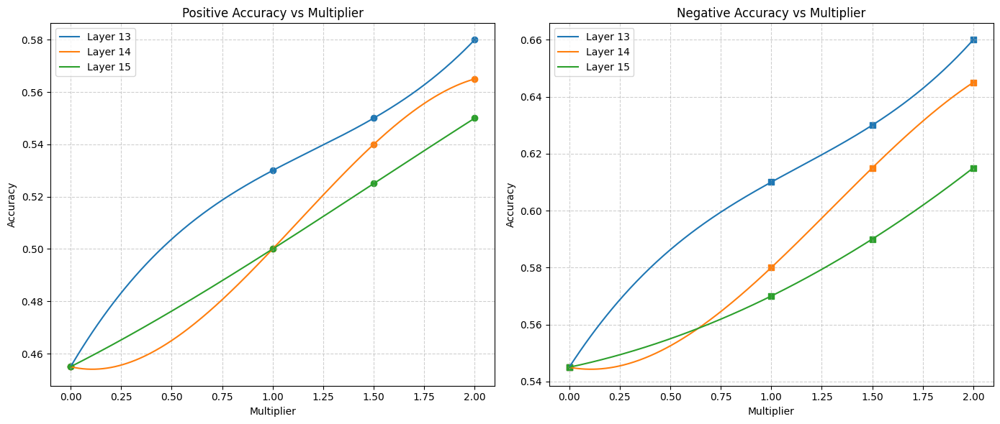

In [41]:
accuracy_instances = [
    {
        "instance_id": "Layer 13",
        "multiplier": [0, 1.0, 1.5, 2],
        "positive_accuracy": [0.4550, 0.5300, 0.5500, 0.5800],
        "negative_accuracy": [0.5450, 0.6100, 0.6300, 0.6600]
    },
    {
        "instance_id": "Layer 14",
        "multiplier": [0, 1.0, 1.5, 2],
        "positive_accuracy": [0.4550, 0.5000, 0.5400, 0.5650],
        "negative_accuracy": [0.5450, 0.5800, 0.6150, 0.6450]
    },
    {
        "instance_id": "Layer 15",
        "multiplier": [0, 1.0, 1.5, 2],
        "positive_accuracy": [0.4550, 0.5000, 0.5250, 0.5500],
        "negative_accuracy": [0.5450, 0.5700, 0.5900, 0.6150]
    }
]
plot_accuracy_instances(accuracy_instances)


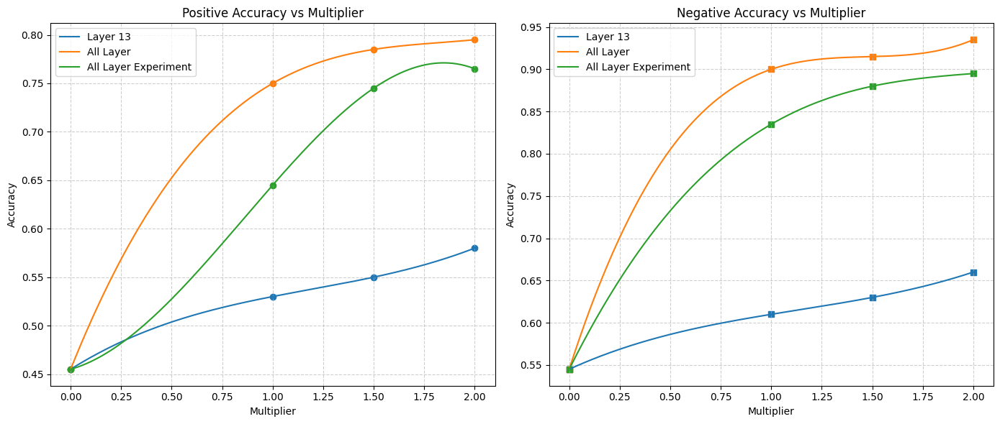

In [42]:
accuracy_instances = [
    {
        "instance_id": "Layer 13",
        "multiplier": [0, 1.0, 1.5, 2],
        "positive_accuracy": [0.4550, 0.5300, 0.5500, 0.5800],
        "negative_accuracy": [0.5450, 0.6100, 0.6300, 0.6600]
    },
    {
        "instance_id": "All Layer",
        "multiplier": [0, 1.0, 1.5, 2],
        "positive_accuracy": [0.4550, 0.7500, 0.7850, 0.7950],
        "negative_accuracy": [0.5450, 0.9000, 0.9150, 0.9350]
    },
    {
        "instance_id": "All Layer Experiment",
        "multiplier": [0, 1.0, 1.5, 2],
        "positive_accuracy": [0.4550, 0.6450, 0.7450, 0.7650],
        "negative_accuracy": [0.5450, 0.8350, 0.8800, 0.8950]
    }
]
plot_accuracy_instances(accuracy_instances)

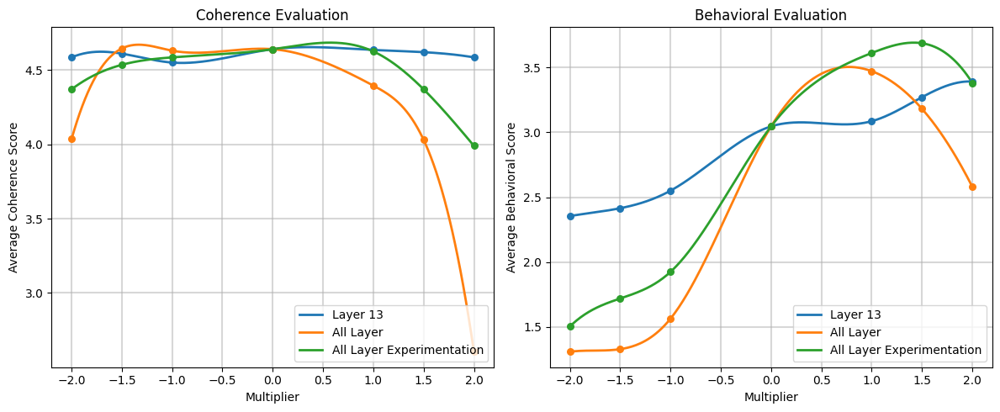

In [43]:
data = {
  'Layer 13': {
      "Coherence":{
         -2.0: 4.585, -1.5: 4.61, -1.0: 4.55, 
          0.0: 4.64,  
          1.0: 4.635,  1.5: 4.62,  2.0: 4.585
      },
      "Behavioral":{
         -2.0: 2.355, -1.5: 2.415, -1.0: 2.55, 
          0.0: 3.045,  
          1.0: 3.085,  1.5: 3.27,  2.0: 3.39
      }
  },
  'All Layer':{
      "Coherence":{
         -2.0: 4.035, -1.5: 4.645, -1.0: 4.63, 
          0.0: 4.64,  
          1.0: 4.395,  1.5: 4.03,  2.0: 2.605
      },
      "Behavioral":{
         -2.0: 1.31, -1.5: 1.33, -1.0: 1.565, 
          0.0: 3.045,  
          1.0: 3.47,  1.5: 3.18,  2.0: 2.58
      }
  },
  'All Layer Experimentation':{
      "Coherence":{
         -2.0: 4.37, -1.5: 4.535, -1.0: 4.585, 
          0.0: 4.64,  
          1.0: 4.625,  1.5: 4.37,  2.0: 3.99
      },
      "Behavioral":{
         -2.0: 1.505, -1.5: 1.72, -1.0: 1.925, 
          0.0: 3.045,  
          1.0: 3.61,  1.5: 3.685,  2.0: 3.38
      }
  },
}


plot_bipo_data(data)

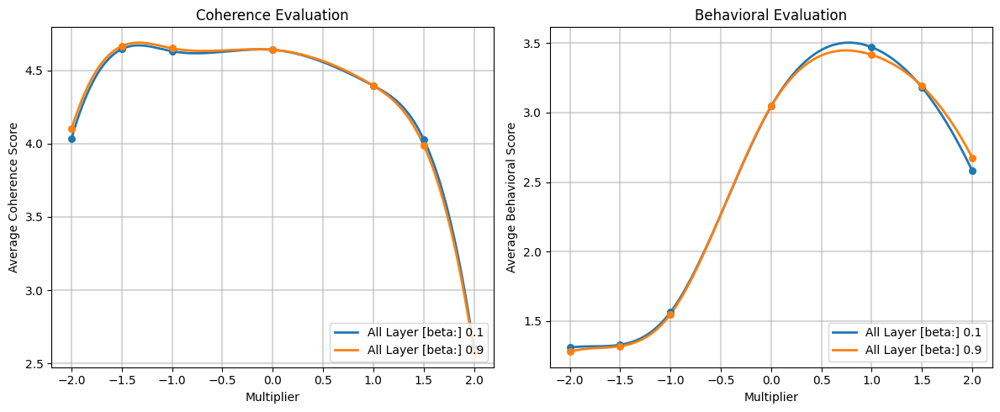

In [44]:


# --- Contoh Penggunaan Fungsi ---
data = {
  'All Layer [beta:] 0.1':{
      "Coherence":{
         -2.0: 4.035, -1.5: 4.645, -1.0: 4.63, 
          0.0: 4.64,  
          1.0: 4.395,  1.5: 4.03,  2.0: 2.605
      },
      "Behavioral":{
         -2.0: 1.31, -1.5: 1.33, -1.0: 1.565, 
          0.0: 3.045,  
          1.0: 3.47,  1.5: 3.18,  2.0: 2.58
      }
  },
  'All Layer [beta:] 0.9':{
      "Coherence":{
         -2.0: 4.1, -1.5: 4.665, -1.0: 4.65, 
          0.0: 4.64,  
          1.0: 4.395,  1.5: 3.99,  2.0: 2.58
      },
      "Behavioral":{
         -2.0: 1.28, -1.5: 1.32, -1.0: 1.55, 
          0.0: 3.045,  
          1.0: 3.415,  1.5: 3.19,  2.0: 2.675
      }
  }
}


plot_bipo_data(data)

# Projec

## 13


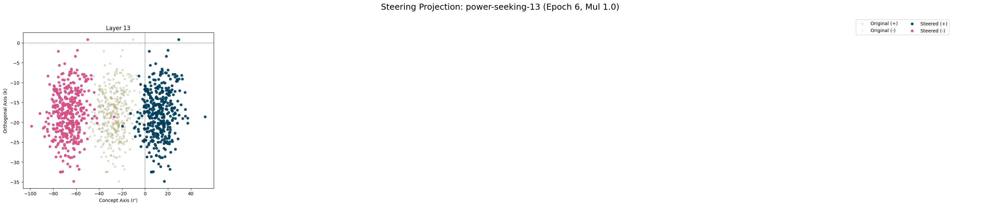

In [40]:
plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/13", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=6, 
    model_id = 'power-seeking-13',
    target_layers=[13], 
    mul=1.0
)

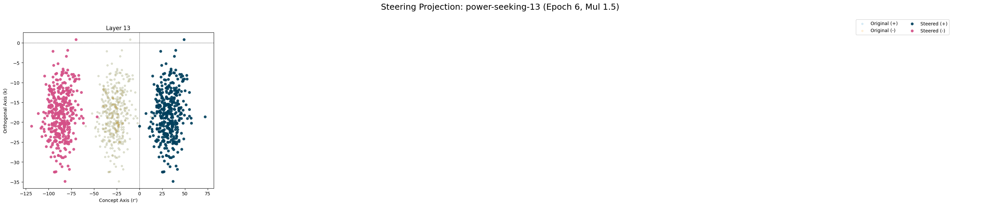

In [41]:
plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/13", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=6, 
    model_id = 'power-seeking-13',
    target_layers=[13], 
    mul=1.5
)

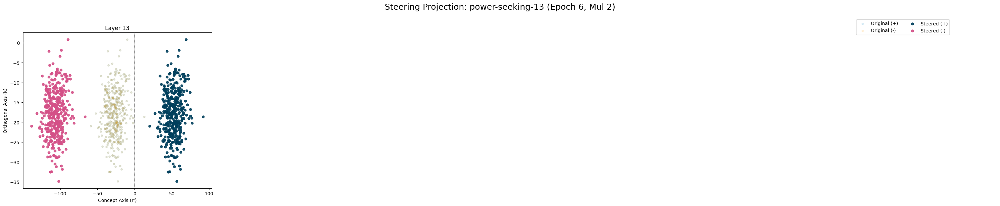

In [42]:
plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/13", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=6, 
    model_id = 'power-seeking-13',
    target_layers=[13], 
    mul=2
)

## All

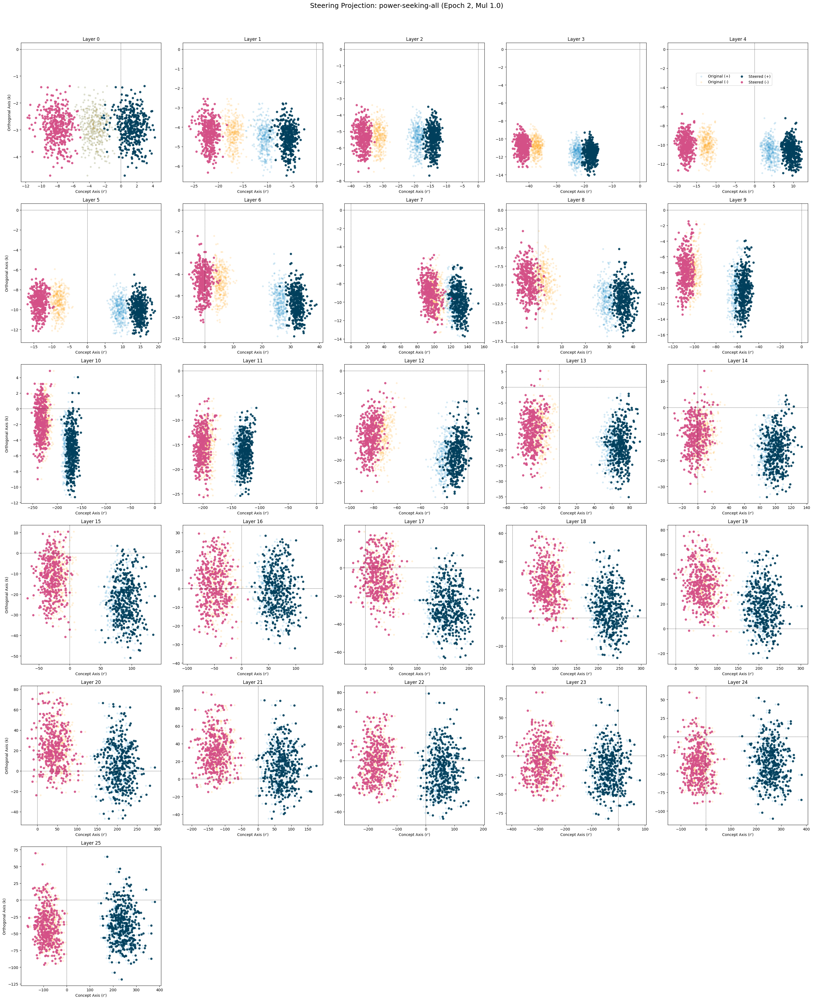

In [43]:
plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/all", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=2, 
    model_id = 'power-seeking-all',
    target_layers=[x for x in range(26)], 
    mul=1.0
)

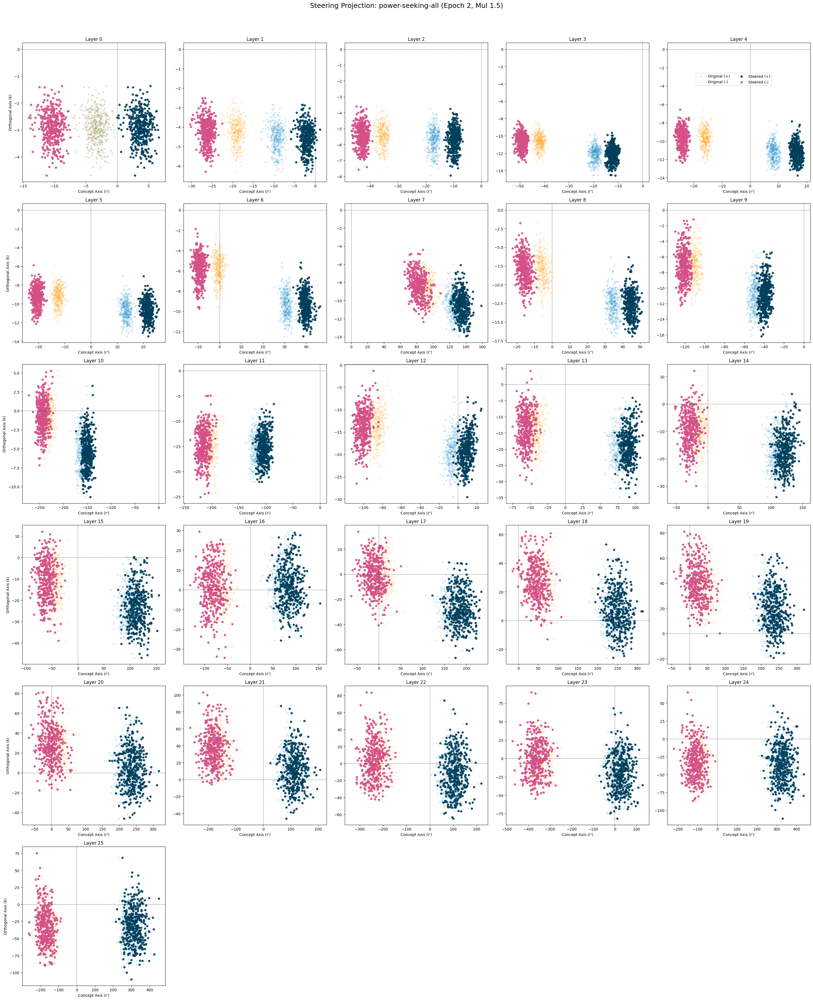

In [44]:
plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/all", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=2, 
    model_id = 'power-seeking-all',
    target_layers=[x for x in range(26)], 
    mul=1.5
)

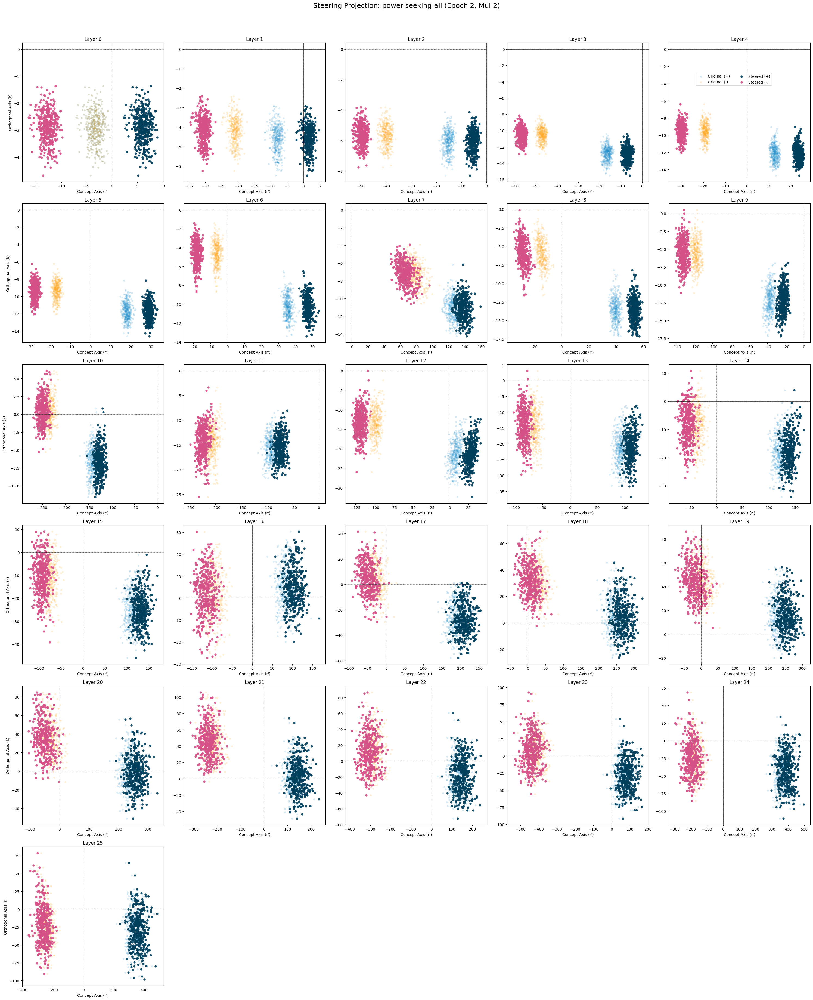

In [45]:
plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/all", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=2, 
    model_id = 'power-seeking-all',
    target_layers=[x for x in range(26)], 
    mul=2
)

## All - exp

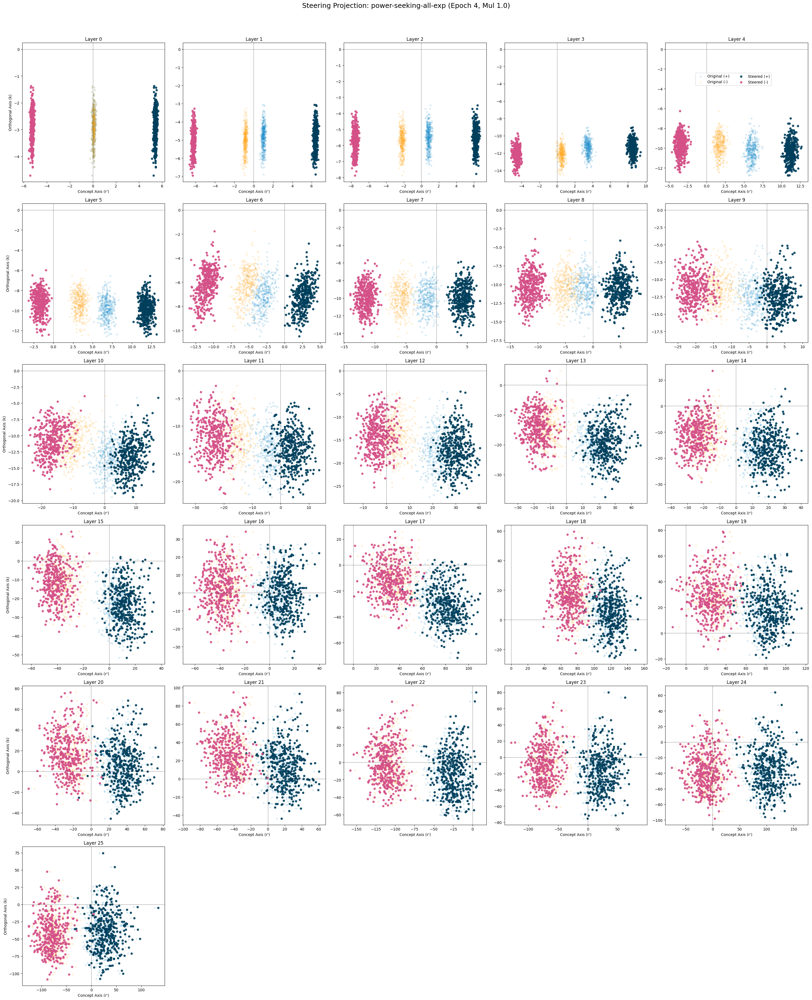

In [46]:
plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/all-exp", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=4, 
    model_id = 'power-seeking-all-exp',
    target_layers=[x for x in range(26)], 
    mul=1.0
)

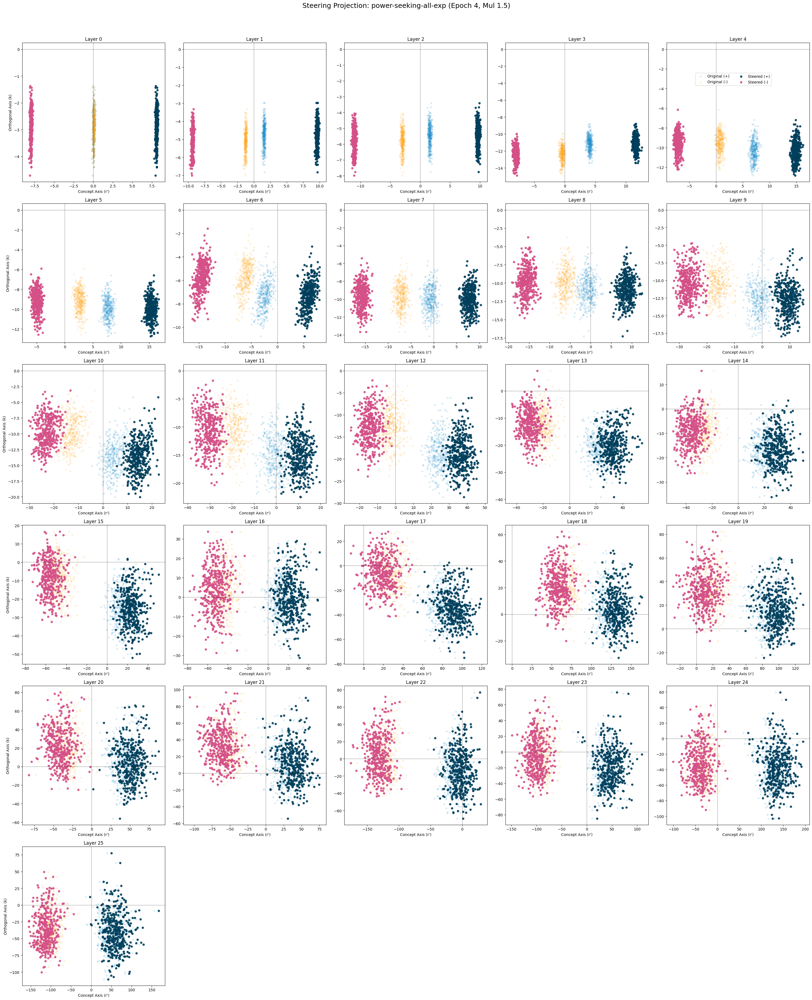

In [47]:
plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/all-exp", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=4, 
    model_id = 'power-seeking-all-exp',
    target_layers=[x for x in range(26)], 
    mul=1.5
)

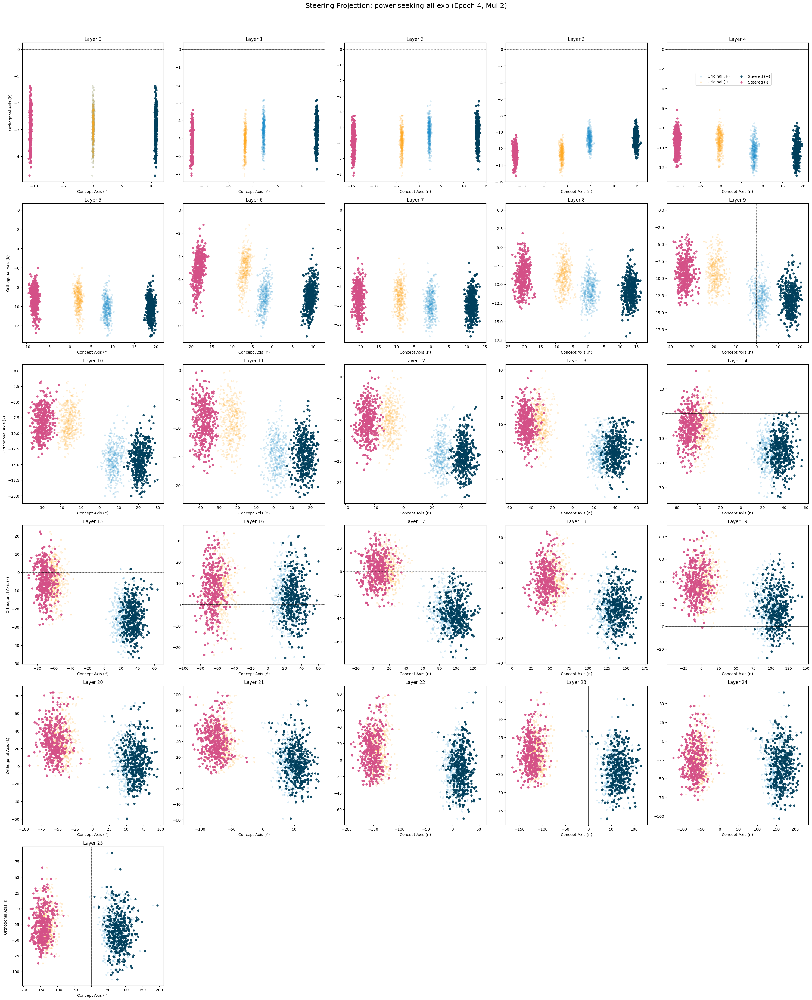

In [48]:
plot_layer_comparison_grid(
    vec_dir="/kaggle/working/thesis/pretrained_vector/power-seeking_gemma-3/all-exp", 
    act_dir="/kaggle/working/thesis/activation/gemma-3-1b-it/power-seeking",
    epoch=4, 
    model_id = 'power-seeking-all-exp',
    target_layers=[x for x in range(26)], 
    mul=2
)